# Final Thesis Plots

In [1]:
import seaborn as sns
import pandas as pd

sns.set(rc={"figure.figsize":(6, 4)})

In [2]:
smoothing = 50

def create_common_df(names, files_arr, size=0, v1=False):
    # Combine different dataframes and calculate rolling mean
    dfs = []
    for name, files in zip(names, files_arr): 
        for file in files:
            df = pd.DataFrame()
            df = pd.read_csv(file)

            if size > 0: 
                df = df.iloc[:size]

            df['algorithm'] = name
            df['episode'] = df.index + 1

            df['rewards'] = df['rewards'].rolling(smoothing,min_periods=1).mean() 
            df['n_passengers'] = df['n_passengers'].rolling(smoothing,min_periods=1).mean()
            df['illegal_moves'] = df['illegal_moves'].rolling(smoothing,min_periods=1).mean() 
            if not v1:
                df['mean_actions_per_pick_up'] = df['mean_actions_per_pick_up'].rolling(smoothing,min_periods=1).mean() 
            df['avg_waiting_time'] = df['avg_waiting_time'].rolling(smoothing,min_periods=1).mean() / 2

            dfs.append(df)     

    df = pd.concat(dfs)
    return df

## Cabworld-v0

In [3]:
ppo_files = ["/home/niko/Info/final-runs/v0/PPO/0/logs.csv","/home/niko/Info/final-runs/v0/PPO/1/logs.csv","/home/niko/Info/final-runs/v0/PPO/2/logs.csv","/home/niko/Info/final-runs/v0/PPO/3/logs.csv","/home/niko/Info/final-runs/v0/PPO/4/logs.csv"]

dqn_files = ["/home/niko/Info/final-runs/v0/DQN/0/logs.csv","/home/niko/Info/final-runs/v0/DQN/1/logs.csv","/home/niko/Info/final-runs/v0/DQN/2/logs.csv","/home/niko/Info/final-runs/v0/DQN/3/logs.csv","/home/niko/Info/final-runs/v0/DQN/4/logs.csv"]

mdqn_files = ["/home/niko/Info/final-runs/v0/M-DQN/0/logs.csv","/home/niko/Info/final-runs/v0/M-DQN/1/logs.csv","/home/niko/Info/final-runs/v0/M-DQN/2/logs.csv","/home/niko/Info/final-runs/v0/M-DQN/3/logs.csv","/home/niko/Info/final-runs/v0/M-DQN/4/logs.csv"]


files_arr = [ppo_files, dqn_files, mdqn_files]
names = ['PPO','DQN','M-DQN']

In [4]:
df = create_common_df(names, files_arr)

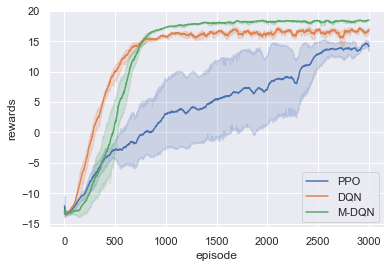

In [5]:
sns.set(rc={"figure.figsize":(6, 4)})

# Rewards
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v0/rewards_v0.png", dpi=300)

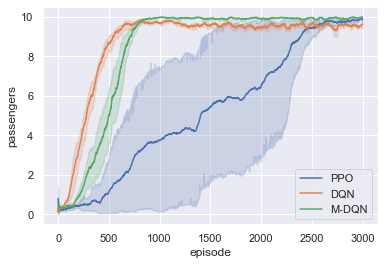

In [6]:
# Passenger
fig = sns.lineplot(data=df, x="episode", y="n_passengers", hue="algorithm")
fig.set(ylabel = "passengers")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v0/n_passengers_v0.png", dpi=300)

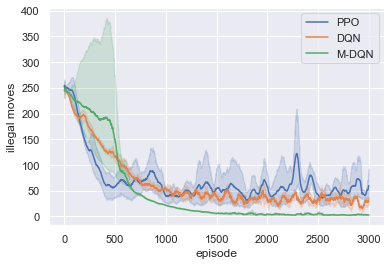

In [7]:
# Illegal moves
fig = sns.lineplot(data=df, x="episode", y="illegal_moves", hue="algorithm")
fig.set(ylabel = "illegal moves")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v0/illegal_moves_v0.png", dpi=300)

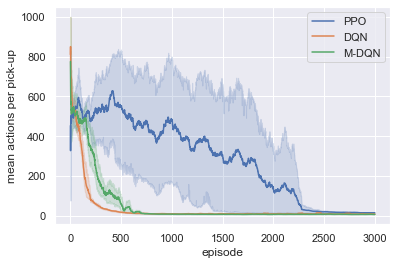

In [8]:
fig =  sns.lineplot(data=df, x="episode", y="mean_actions_per_pick_up", hue="algorithm")
fig.set(ylabel = "mean actions per pick-up")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v0/useless_steps_v0.png", dpi=300)

## Cabworld-v1

In [9]:
ppo_files = ["/home/niko/Info/final-runs/v1/PPO/0/logs.csv","/home/niko/Info/final-runs/v1/PPO/1/logs.csv","/home/niko/Info/final-runs/v1/PPO/2/logs.csv","/home/niko/Info/final-runs/v1/PPO/3/logs.csv","/home/niko/Info/final-runs/v1/PPO/4/logs.csv"]

dqn_files = ["/home/niko/Info/final-runs/v1/DQN/0/logs.csv","/home/niko/Info/final-runs/v1/DQN/1/logs.csv","/home/niko/Info/final-runs/v1/DQN/2/logs.csv","/home/niko/Info/final-runs/v1/DQN/3/logs.csv","/home/niko/Info/final-runs/v1/DQN/4/logs.csv"]

mdqn_files = ["/home/niko/Info/final-runs/v1/M-DQN/0/logs.csv","/home/niko/Info/final-runs/v1/M-DQN/1/logs.csv","/home/niko/Info/final-runs/v1/M-DQN/2/logs.csv","/home/niko/Info/final-runs/v1/M-DQN/3/logs.csv","/home/niko/Info/final-runs/v1/M-DQN/4/logs.csv"]

files_arr = [ppo_files, dqn_files, mdqn_files]
names = ['PPO','DQN', 'M-DQN']

In [10]:
# v1 was trained with old metric so it doesnt have mean steps per pick-up
df = create_common_df(names, files_arr, v1=True)

df = df[df.episode > 10]

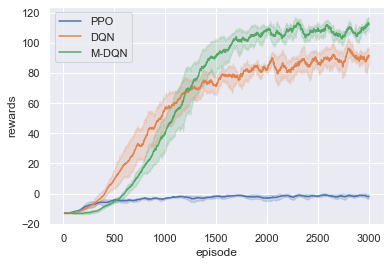

In [11]:
sns.set(rc={"figure.figsize":(6, 4)})

# Rewards
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v1/rewards_v1.png", dpi=300)

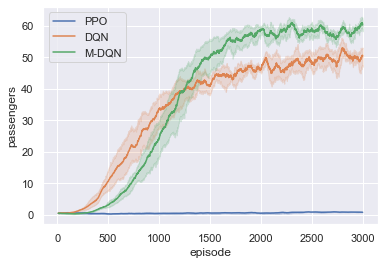

In [12]:
# Passenger
fig = sns.lineplot(data=df, x="episode", y="n_passengers", hue="algorithm")
fig.set(ylabel = "passengers")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v1/n_passengers_v1.png", dpi=300)

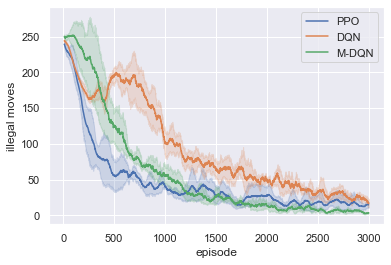

In [13]:
# Illegal moves
fig = sns.lineplot(data=df, x="episode", y="illegal_moves", hue="algorithm")
fig.set(ylabel = "illegal moves")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v1/illegal_moves_v1.png", dpi=300)

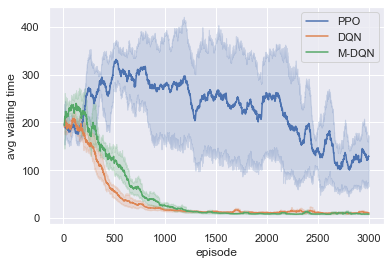

In [14]:
fig =  sns.lineplot(data=df, x="episode", y="avg_waiting_time", hue="algorithm")
fig.set(ylabel = "avg waiting time")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v1/avg_waiting_time_v1.png", dpi=300)

## Cabworld-v2

In [15]:
stage0_files = ["/home/niko/Info/final-runs/v2/Stage0/0/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage0/1/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage0/2/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage0/3/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage0/4/logs_summed.csv",]

stage1_files = ["/home/niko/Info/final-runs/v2/Stage1/0/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/1/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage1/2/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/3/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/4/logs_summed.csv"]

stage2_files = ["/home/niko/Info/final-runs/v2/Stage2/0/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/1/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage2/2/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/3/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/4/logs_summed.csv"]

files_arr = [stage0_files, stage1_files, stage2_files]
names = ['Stage 0','Stage 1', 'Stage 2']

smoothing=100

In [16]:
df = create_common_df(names, files_arr, 5000)

df = df[df.episode > 10]

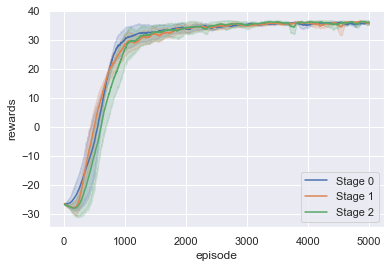

In [17]:
# Rewards
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/rewards_v2.png", dpi=300)

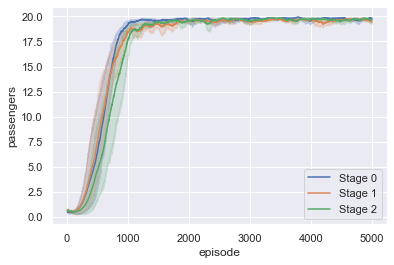

In [18]:
# Passenger
fig = sns.lineplot(data=df, x="episode", y="n_passengers", hue="algorithm")
fig.set(ylabel = "passengers")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/n_passengers_v2.png", dpi=300)

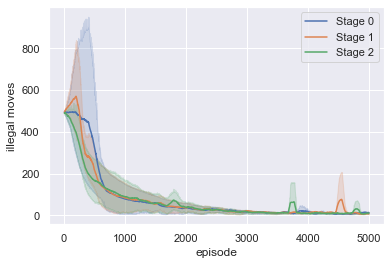

In [19]:
# Illegal moves
fig = sns.lineplot(data=df, x="episode", y="illegal_moves", hue="algorithm")
fig.set(ylabel = "illegal moves")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/illegal_moves_v2.png", dpi=300)

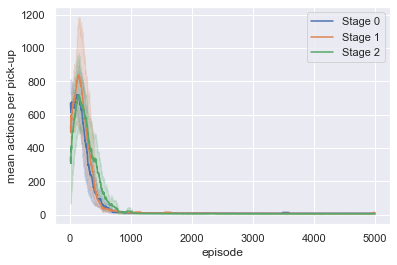

In [20]:
# Avg waiting time
fig =  sns.lineplot(data=df, x="episode", y="mean_actions_per_pick_up", hue="algorithm")
fig.set(ylabel = "mean actions per pick-up")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/mean_actions_per_pick_up_v2.png", dpi=300)

## Eval runs


In [25]:
stage0_files = ["/home/niko/Info/final-runs/v2/Stage0/0/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage0/1/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage0/2/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage0/3/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage0/4/eval/logs_summed.csv",]

stage1_files = ["/home/niko/Info/final-runs/v2/Stage1/0/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/1/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage1/2/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/3/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage1/4/eval/logs_summed.csv"]

stage2_files = ["/home/niko/Info/final-runs/v2/Stage2/0/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/1/eval/logs_summed.csv", "/home/niko/Info/final-runs/v2/Stage2/2/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/3/eval/logs_summed.csv","/home/niko/Info/final-runs/v2/Stage2/4/eval/logs_summed.csv"]

files_arr = [stage0_files, stage1_files ,stage2_files]
names = ['Stage 0','Stage 1','Stage 2']

In [26]:
df = create_common_df(names, files_arr)

df = df[df.episode > 10]

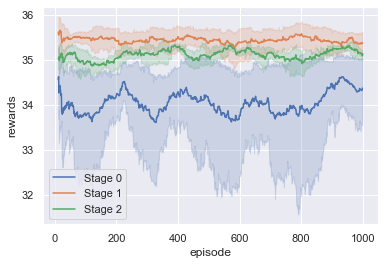

In [27]:
# Rewards
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/rewards_eval_v2.png", dpi=300)

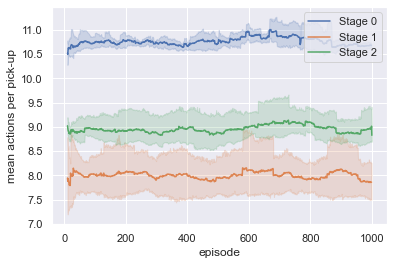

In [28]:
# Avg waiting time
fig =  sns.lineplot(data=df, x="episode", y="mean_actions_per_pick_up", hue="algorithm")
fig.set(ylabel = "mean actions per pick-up")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/mean_actions_per_pick_up_eval_v2.png", dpi=300)

## ADV

In [29]:
stage2_files = ["/home/niko/Info/final-runs/v2/ADV/0/logs_summed.csv", "/home/niko/Info/final-runs/v2/ADV/1/logs_summed.csv", "/home/niko/Info/final-runs/v2/ADV/2/logs_summed.csv", "/home/niko/Info/final-runs/v2/ADV/3/logs_summed.csv", "/home/niko/Info/final-runs/v2/ADV/4/logs_summed.csv"]

files_arr = [stage2_files]
names = ['Stage 2']


In [30]:
df = create_common_df(names, files_arr)
df = df[df.episode > 10]

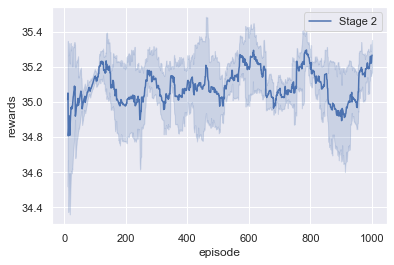

In [31]:
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2/rewards_adv_v2.png", dpi=300)

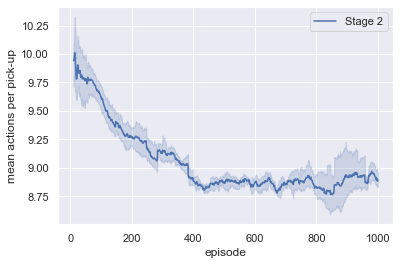

In [32]:
fig =  sns.lineplot(data=df, x="episode", y="mean_actions_per_pick_up", hue="algorithm")
fig.set(ylabel = "mean actions per pick-up")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v2//mean_actions_per_pick_up_adv_v2.png", dpi=300)

## Cabworld-v3


In [33]:
stage0_files = ["/home/niko/Info/final-runs/v3/Stage0/0/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage0/1/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/2/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage0/3/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/4/logs_summed.csv"]
stage1_files = ["/home/niko/Info/final-runs/v3/Stage1/0/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage1/1/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/2/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage1/3/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/4/logs_summed.csv"]
stage2_files = ["/home/niko/Info/final-runs/v3/Stage2/0/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage2/1/logs_summed.csv", "/home/niko/Info/final-runs/v3/Stage2/2/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage2/3/logs_summed.csv"]

files_arr = [stage0_files,stage1_files, stage2_files]
names = ['Stage 0', 'Stage 1','Stage 2']


In [34]:
df = create_common_df(names, files_arr, 5000)

# cut off first 10 episodes
df = df[df.episode > 10]

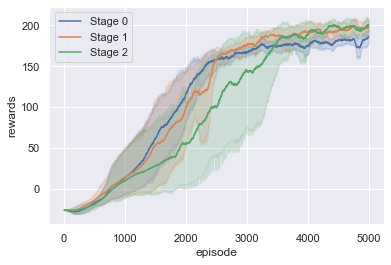

In [35]:
# Rewards
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/rewards_v3.png", dpi=300)

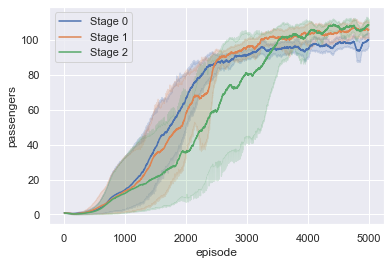

In [36]:
# Passenger
fig = sns.lineplot(data=df, x="episode", y="n_passengers", hue="algorithm")
fig.set(ylabel = "passengers")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/n_passengers_v3.png", dpi=300)

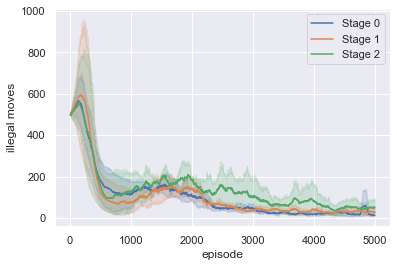

In [37]:
fig = sns.lineplot(data=df, x="episode", y="illegal_moves", hue="algorithm")
fig.set(ylabel = "illegal moves")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/illegal_moves_v3.png", dpi=300)

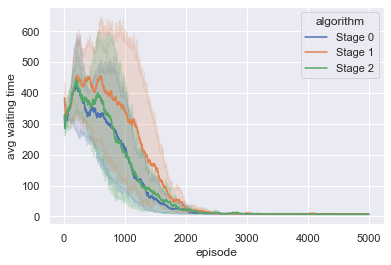

In [38]:
fig =  sns.lineplot(data=df, x="episode", y="avg_waiting_time", hue="algorithm")
fig.set(ylabel = "avg waiting time")
fig.figure.savefig("/home/niko/Desktop/runs/v3/avg_waiting_time_v3.png", dpi=300)

## Eval runs

In [39]:
stage0_files = ["/home/niko/Info/final-runs/v3/Stage0/0/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/1/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/2/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/3/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage0/4/eval/logs_summed.csv"]

stage1_files = ["/home/niko/Info/final-runs/v3/Stage1/0/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/1/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/2/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/3/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage1/4/eval/logs_summed.csv"]

stage2_files = ["/home/niko/Info/final-runs/v3/Stage2/0/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage2/1/eval/logs_summed.csv","/home/niko/Info/final-runs/v3/Stage2/2/eval/logs_summed.csv"]

files_arr = [stage0_files, stage1_files, stage2_files]
names = ['Stage 0','Stage 1','Stage 2']

In [40]:
df = create_common_df(names, files_arr)

df = df[df.episode > 10]

In [41]:
rewards0 = df[df['algorithm'] == "Stage 0"]['avg_waiting_time'].mean()
rewards1 = df[df['algorithm'] == "Stage 1"]['avg_waiting_time'].mean()
rewards2 = df[df['algorithm'] == "Stage 2"]['avg_waiting_time'].mean()

print(rewards0/rewards1)
print(rewards0/rewards2)


1.1984469684391827
1.269434890167112


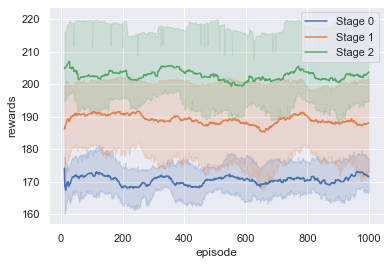

In [42]:
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/rewards_eval_v3.png", dpi=300)

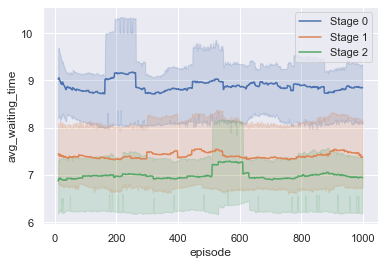

In [43]:
fig =  sns.lineplot(data=df, x="episode", y="avg_waiting_time", hue="algorithm")
fig.set(ylabel = "avg_waiting_time")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/avg_waiting_time_eval_v3.png", dpi=300)

## ADV

In [44]:
stage2_files = ["/home/niko/Info/final-runs/v3/ADV/0/logs_summed.csv", "/home/niko/Info/final-runs/v3/ADV/1/logs_summed.csv", "/home/niko/Info/final-runs/v3/ADV/2/logs_summed.csv", "/home/niko/Info/final-runs/v3/ADV/3/logs_summed.csv", "/home/niko/Info/final-runs/v3/ADV/4/logs_summed.csv"]

files_arr = [stage2_files]
names = ['Stage 2']

In [45]:
df = create_common_df(names, files_arr)
df = df[df.episode > 10]

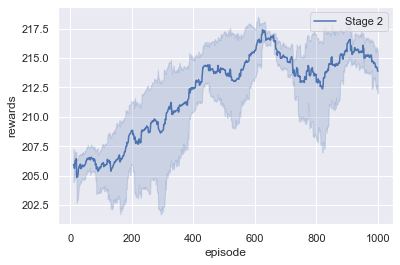

In [46]:
fig = sns.lineplot(data=df, x="episode", y="rewards", hue="algorithm")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/rewards_adv_v3.png", dpi=300)

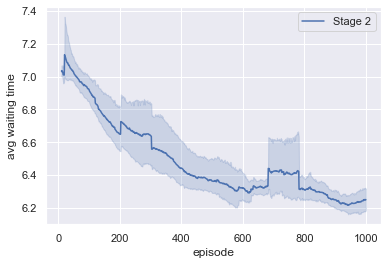

In [47]:
fig =  sns.lineplot(data=df, x="episode", y="avg_waiting_time", hue="algorithm")
fig.set(ylabel = "avg waiting time")
fig.legend_.set_title(None)
fig.figure.savefig("/home/niko/Desktop/runs/v3/avg_waiting_time_adv_v3.png", dpi=300)